In [1]:
import sys
sys.path.append("/n/fs/xl-diffbia/projects/stable-diffusion")

In [2]:
import os
import cv2
from glob import glob
from PIL import Image
import copy
import math
import argparse
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output

import torch
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid

/n/fs/xl-diffbia/software/anaconda3/envs/latent-diffusion/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# 40 occupations
social_job_list = ["administrative assistant", "electrician", "author", "optician", "announcer", "chemist", "butcher", "building inspector", "bartender", "childcare worker", "chef", "CEO", "biologist", "bus driver", "crane operator", "drafter", "construction worker", "doctor", "custodian", "cook", "nurse practitioner", "mail carrier", "lab tech", "pharmacist", "librarian", "nurse", "housekeeper", "pilot", "roofer", "police officer", "PR person", "customer service representative", "software developer", "special ed teacher", "receptionist", "plumber", "security guard", "technical writer", "telemarketer", "veterinarian"]


In [4]:
def get_job_prompt(job_name, prompt_date, gender_label=None):
    if prompt_date == "2023-10-12" or prompt_date == "2023-10-15":
        extend_description = [" single", " in the center"]
    elif prompt_date == "2023-10-26" or prompt_date == "2023-10-29":
        extend_description = [" single", ""]
    elif prompt_date == "2023-11-03" or prompt_date == "2023-11-04":
        extend_description = ["", " in the center"]
    elif prompt_date == "2023-11-05" or prompt_date == "2023-11-06":
        extend_description = ["", ""]
    else:
        raise ValueError("invalid experiments date")

    if gender_label is None:
        return "A photo of a{} {}{}.".format(extend_description[0], job_name.lower(), extend_description[1])
    else:
        assert gender_label == "male" or gender_label == "female", "unspecified gender label"
        return "A photo of a{}{} {}{}.".format(extend_description[0], f" {gender_label}", job_name.lower(), extend_description[1])

In [5]:
def get_generic_prompt(prompt_date, gender_label=None):
    if prompt_date == "2023-10-30":
        extend_description = ["", " in the center"]
    elif prompt_date == "2023-10-31":
        extend_description = ["", ""]
    elif prompt_date == "2023-11-01":
        extend_description = [" single", " in the center"]
    elif prompt_date == "2023-11-02":
        extend_description = [" single", ""]
    else:
        raise ValueError("invalid experiments date")

    if gender_label is None:
        return "A photo of a{} person{}.".format(extend_description[0], extend_description[1])
    else:
        assert gender_label == "male" or gender_label == "female", "unspecified gender label"
        return "A photo of a{}{} person{}.".format(extend_description[0], f" {gender_label}", extend_description[1])

In [13]:
class SimpleShowDataset(Dataset):
    """An simple image dataset for calculating inception score and FID."""

    def __init__(self, root, subset=None, exp_date="none", domain=None, exts=['png', 'jpg', 'JPEG'], transform=None, transform_show=None, num_images=None):
        """Construct an image dataset.

        Args:
            root: Path to the image directory. This directory will be
                  recursively searched.
            subset: String name of subset samples directory. 
                    This directory will be recursively searched.
            exp_date: date of experiments to format prompt
            exts: List of extensions to search for.
            transform: A torchvision transform to apply to the images. If
                       None, the images will be converted to tensors.
            num_images: The number of images to load. If None, all images
                        will be loaded.
        """
        self.paths = []
        if transform is not None:
            self.transform = transform
        else:
            self.transform = transforms.ToTensor()
        if transform_show is not None:
            self.transform_show = transform_show
        if subset is not None:
            subset_dir = get_job_prompt(subset, exp_date, domain).lower().replace(" ", "_")
            root = os.path.join(root, subset_dir)
        if exp_date in ["2023-10-30", "2023-10-31", "2023-11-01", "2023-11-02"]:
            subset_dir = get_generic_prompt(exp_date, domain).lower().replace(" ", "_")
            root = os.path.join(root, subset_dir)
        for ext in exts:
            if domain is None:
                self.paths.extend(
                    list(glob(
                        os.path.join(root, '**/*.%s' % ext), recursive=True)))
            elif domain == "female":
                all_files = list(glob(os.path.join(root, '**/*.%s' % ext), recursive=True))
                filter_files = [each_file for each_file in all_files if "female" in each_file]
                self.paths.extend(filter_files)
            elif domain == "male":
                all_files = list(glob(os.path.join(root, '**/*.%s' % ext), recursive=True))
                filter_files = []
                for each_file in all_files:
                    if "male" in each_file and "female" not in each_file:
                        filter_files.append(each_file)
                self.paths.extend(filter_files)
        self.paths = self.paths[:num_images]

    def __len__(self):              # noqa
        return len(self.paths)

    def __getitem__(self, idx):     # noqa
        image = Image.open(self.paths[idx])
        image = image.convert('RGB')        # fix ImageNet grayscale images
        if self.transform_show is not None:
            image_show = self.transform_show(image)
        image_tensor = self.transform(image)
        return image_show, image_tensor, self.paths[idx]

In [22]:
def show_image_row(image_batch, prompt_title, cfg_w, nmax=8):
    plt.close() # close previous plot
    fig, ax = plt.subplots(figsize=(16, 16 * nmax))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid((image_batch.detach())).permute(1, 2, 0))
    if prompt_title is not None:
        plt.title(f"Text prompt: {prompt_title} With cfg_w = {cfg_w}")
    plt.show()

In [8]:
transform_show = transforms.Compose(
                        [
                            transforms.Resize(size=224, interpolation="bicubic", max_size=None, antialias=None),
                            transforms.CenterCrop(size=(224, 224)),
                            transforms.PILToTensor()
                        ]
                    )
transform_show = transforms.PILToTensor() # resolution = 512

In [44]:
# number of images to show per row
batch_size = 16
master_folder = "/n/fs/xl-diffbia/projects/stable-diffusion/logs/samples"

### failure case

In [45]:
prompt_dict = {
    "2023-11-02": "A photo of a single person.", 
    "2023-11-01": "A photo of a single person in the center.",
}

#### "A photo of a single person."

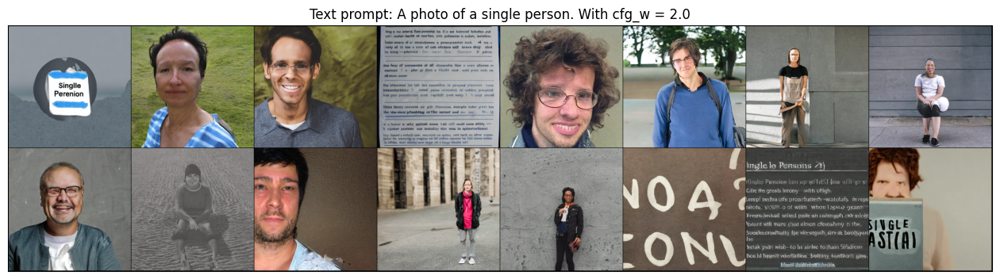

In [46]:
cfg_w = 2.0
guide_folder = os.path.join(master_folder, "2023-11-02", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-11-02")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-11-02"], cfg_w)

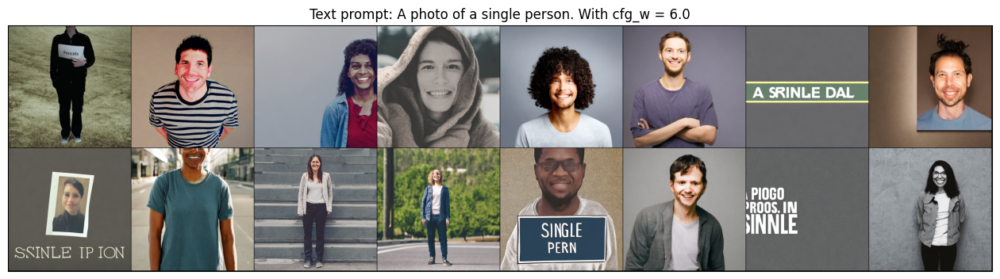

In [47]:
cfg_w = 6.0
guide_folder = os.path.join(master_folder, "2023-11-02", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-11-02")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-11-02"], cfg_w)

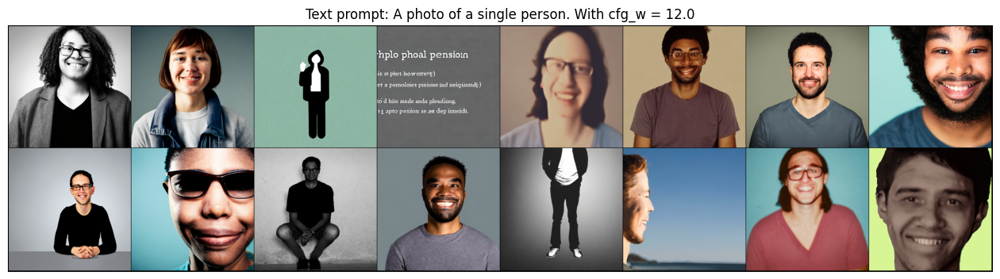

In [48]:
cfg_w = 12.0
guide_folder = os.path.join(master_folder, "2023-11-02", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-11-02")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-11-02"], cfg_w)

#### "A photo of a single person in the center."

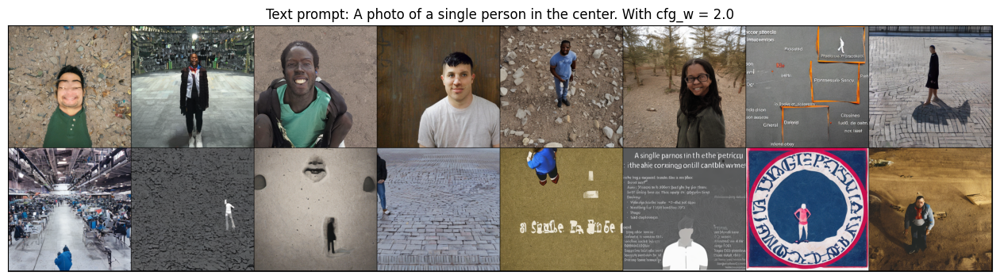

In [49]:
cfg_w = 2.0
guide_folder = os.path.join(master_folder, "2023-11-01", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-11-01")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-11-01"], cfg_w)

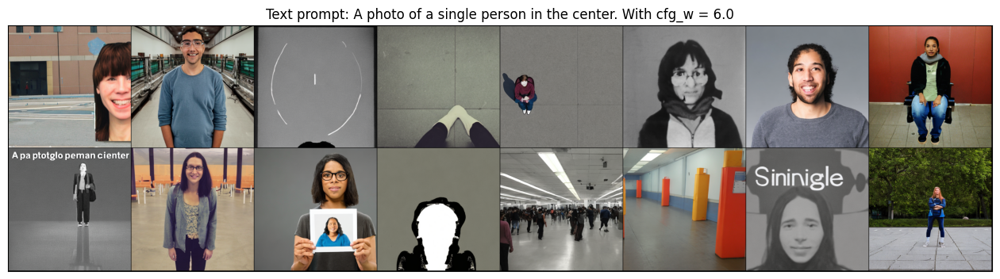

In [51]:
cfg_w = 6.0
guide_folder = os.path.join(master_folder, "2023-11-01", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-11-01")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-11-01"], cfg_w)

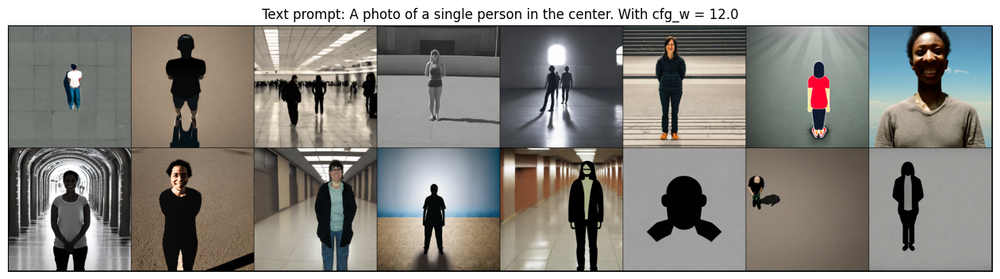

In [52]:
cfg_w = 12.0
guide_folder = os.path.join(master_folder, "2023-11-01", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-11-01")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-11-01"], cfg_w)

### common case

In [53]:
prompt_dict = {
    "2023-10-31": "A photo of a person.", 
    "2023-10-30": "A photo of a person in the center.",
    "2023-10-12": "A photo of a single [JOB].", 
    "2023-10-26": "A photo of a single [JOB] in the center.",
}

#### "A photo of a person."

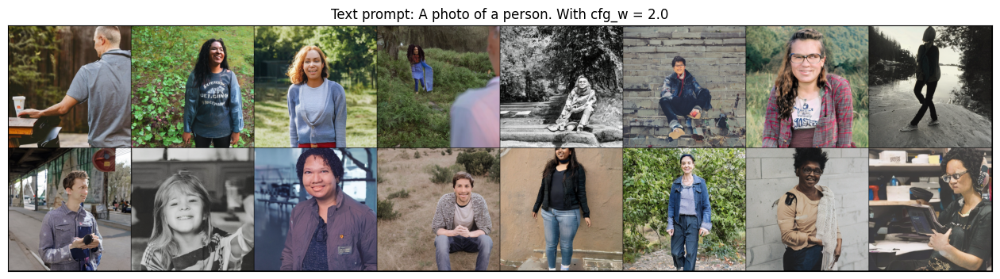

In [54]:
cfg_w = 2.0
guide_folder = os.path.join(master_folder, "2023-10-31", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-31")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-31"], cfg_w)

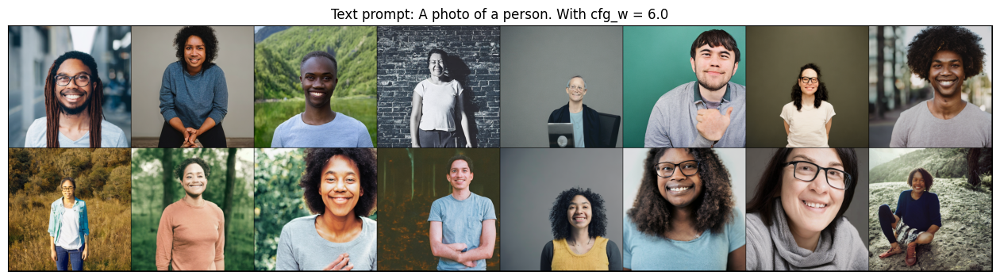

In [55]:
cfg_w = 6.0
guide_folder = os.path.join(master_folder, "2023-10-31", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-31")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-31"], cfg_w)

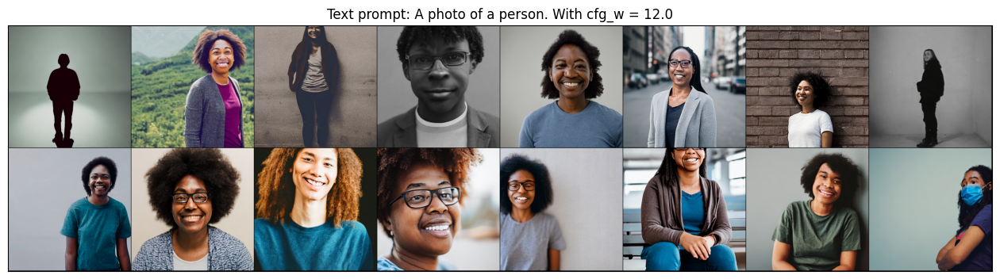

In [57]:
cfg_w = 12.0
guide_folder = os.path.join(master_folder, "2023-10-31", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-31")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-31"], cfg_w)

#### "A photo of a person in the center."

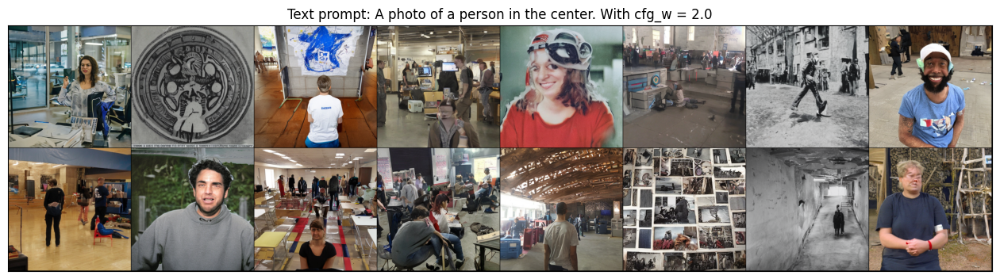

In [61]:
cfg_w = 2.0
guide_folder = os.path.join(master_folder, "2023-10-30", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-30")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-30"], cfg_w)

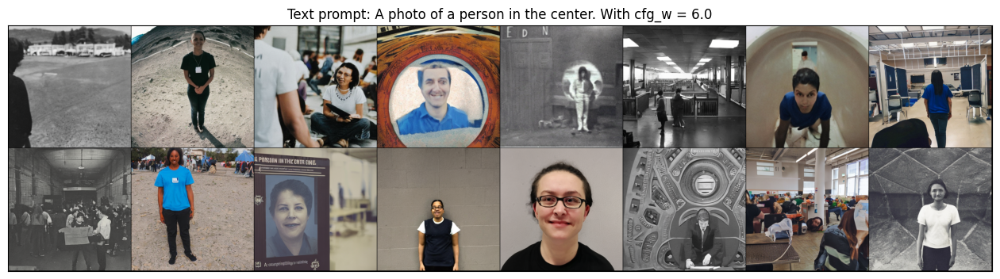

In [65]:
cfg_w = 6.0
guide_folder = os.path.join(master_folder, "2023-10-30", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-30")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-30"], cfg_w)

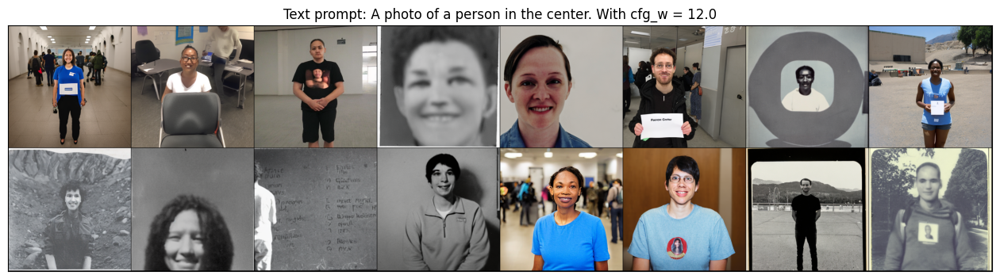

In [64]:
cfg_w = 12.0
guide_folder = os.path.join(master_folder, "2023-10-30", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-30")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-30"], cfg_w)

#### "A photo of a single [JOB]."

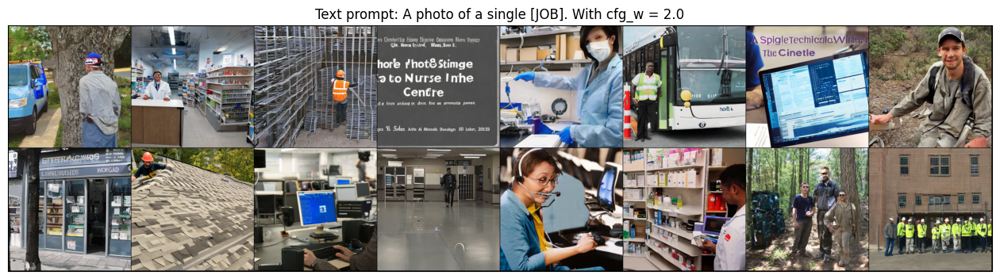

In [66]:
cfg_w = 2.0
guide_folder = os.path.join(master_folder, "2023-10-12", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-12")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-12"], cfg_w)

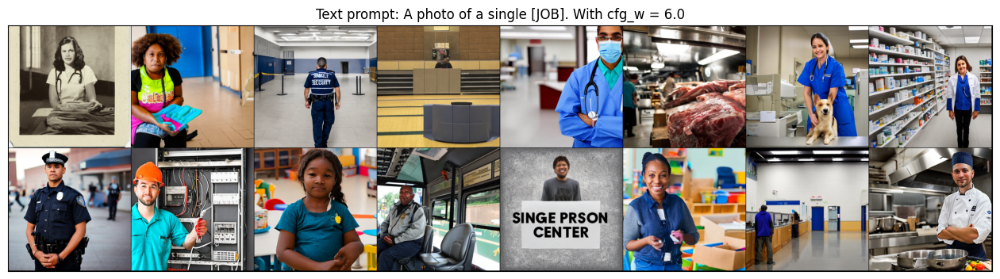

In [67]:
cfg_w = 6.0
guide_folder = os.path.join(master_folder, "2023-10-12", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-12")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-12"], cfg_w)

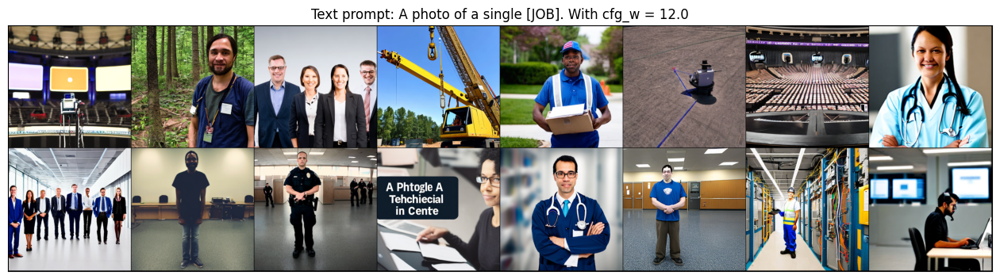

In [68]:
cfg_w = 12.0
guide_folder = os.path.join(master_folder, "2023-10-12", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-12")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-12"], cfg_w)

#### A photo of a single [JOB] in the center.

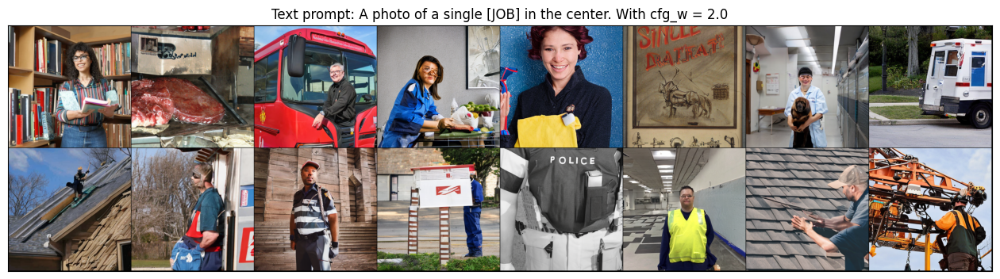

In [69]:
cfg_w = 2.0
guide_folder = os.path.join(master_folder, "2023-10-26", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-26")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-26"], cfg_w)

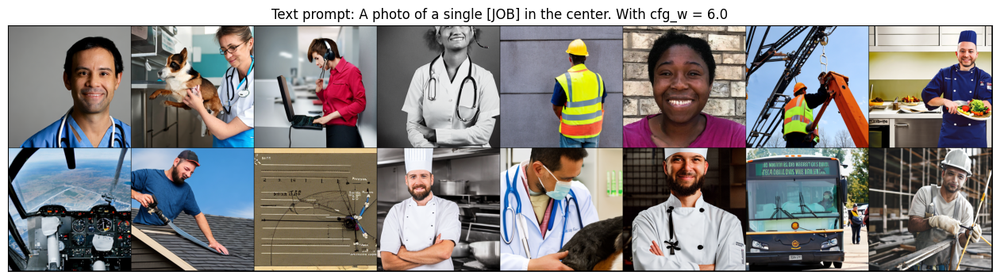

In [72]:
cfg_w = 6.0
guide_folder = os.path.join(master_folder, "2023-10-26", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-26")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-26"], cfg_w)

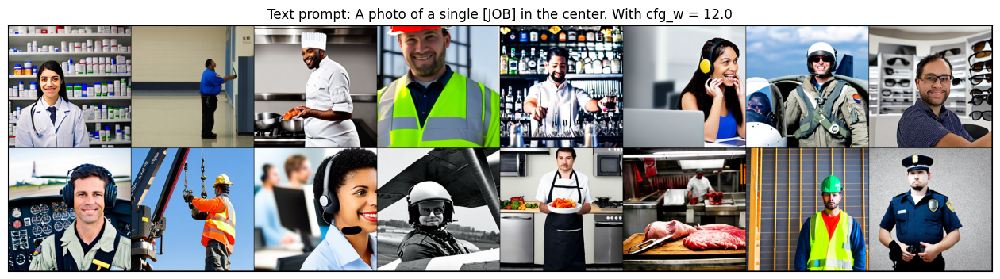

In [71]:
cfg_w = 12.0
guide_folder = os.path.join(master_folder, "2023-10-26", f"guide_w{cfg_w}")

# prepare data
txtimg_gen_dataset = SimpleShowDataset(root = guide_folder, transform = transforms.ToTensor(), transform_show = transform_show, exp_date="2023-10-26")
txtimg_gen_dataloader = DataLoader(txtimg_gen_dataset, batch_size = batch_size, shuffle=True, num_workers=4)
image_show, image_tensor, path_dir = next(iter(txtimg_gen_dataloader))

show_image_row(image_show, prompt_dict["2023-10-26"], cfg_w)